<a href="https://colab.research.google.com/github/Mansi-2829/AIML---Capstone-Project-/blob/master/Capstone_project1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


***Importing the basic necessary python libraries and modules***

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [3]:
# Reading the dataset

project_path = '/content/drive/My Drive/Assignment/'
file_name ='input_data.xlsx'

In [4]:
df=pd.read_excel(project_path+file_name)

#Displaying the top 10 records of the dataframe

df.head(10)

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0
9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0


In [5]:
#Displaying the data type of each attribute

df.dtypes

Short description    object
Description          object
Caller               object
Assignment group     object
dtype: object

In [6]:
#Displaying the shape of the dataframe

df.shape

(8500, 4)

*This shows that there are 8500 rows and 4 attributes in the dataframe.*

In [7]:
# Displaying the information regarding the attributes

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


*Since Caller column mainly contains the details of the user who raised the incident and is of not much use in our analysis and can be dropped. Assignment group is our predictor / target column with multiple classes. So, this is a Multiclass Classification problem..*



In [8]:
# Dropping the caller column

df1 = df.drop('Caller',axis=1)

# Displaying the top 5 records of the dataframe after dropping the Caller column

df1.head()

,Short description,Description,Assignment group
0,login issue,-verified user details.(employee# & manager na...,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,GRP_0
4,skype error,skype error,GRP_0


In [9]:
#Checking the null/missing values in the dataframe

df1.isnull().sum()

Short description    8
Description          1
Assignment group     0
dtype: int64

In [10]:
!pip install missingno

In [11]:
import missingno as msno

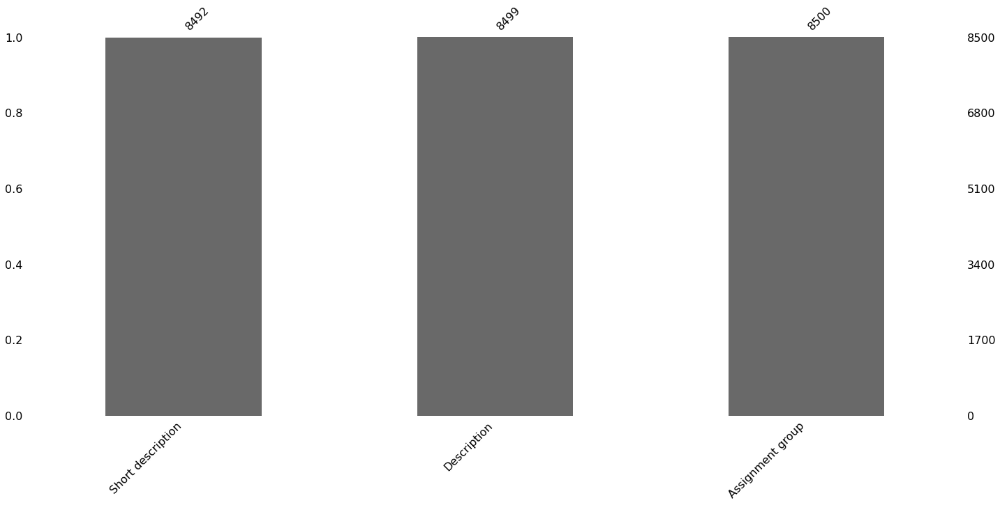

In [12]:
# Visualizing the number of missing values as a bar chart  

msno.bar(df1)

*Thus we can observe from here that their are total 8 NaN values in short description and 1 NaN value in Description attribute*

In [13]:
#Displaying the records with NaN value in Short Description and Description column

df1[df1.isnull().any(axis=1)]

,Short description,Description,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,GRP_0
4395,i am locked out of skype,NaN,GRP_0


In [14]:
# Filling the NaN value in Short Description and Description column by space(" ")

df1['Short description'].fillna(value=" ",inplace=True)
df1['Description'].fillna(value = " ",inplace=True)

In [15]:
#Again Checking the null/missing values in the dataframe

df1.isnull().sum()

Short description    0
Description          0
Assignment group     0
dtype: int64

In [16]:
#Concatenate Short Description and Description columns in a new column "New Description"

df1['New Description'] = df1['Short description'] + ' ' +df1['Description']

#Displaying the first 5 records of the new concatenated dataframe

df1.head()

,Short description,Description,Assignment group,New Description
0,login issue,-verified user details.(employee# & manager na...,GRP_0,login issue -verified user details.(employee# ...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...
3,unable to access hr_tool page,unable to access hr_tool page,GRP_0,unable to access hr_tool page unable to access...
4,skype error,skype error,GRP_0,skype error skype error


In [17]:
# Displaying the Duplicate recors in the dataframe

df_copy = df1[['Short description', 'Description','Assignment group','New Description']].copy()
duplicateRowsDF = df_copy[df_copy.duplicated()]
duplicateRowsDF



,Short description,Description,Assignment group,New Description
51,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,GRP_0,call for ecwtrjnq jpecxuty call for ecwtrjnq j...
81,erp SID_34 account locked,erp SID_34 account locked,GRP_0,erp SID_34 account locked erp SID_34 account l...
123,unable to display expense report,unable to display expense report,GRP_0,unable to display expense report unable to dis...
157,ess password reset,ess password reset,GRP_0,ess password reset ess password reset
229,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,GRP_0,call for ecwtrjnq jpecxuty call for ecwtrjnq j...
235,erp SID_34 account unlock and password reset,erp SID_34 account unlock and password reset,GRP_0,erp SID_34 account unlock and password reset e...
242,windows password reset,windows password reset,GRP_0,windows password reset windows password reset
274,windows account locked,windows account locked,GRP_0,windows account locked windows account locked
301,windows password reset,windows password reset,GRP_0,windows password reset windows password reset
312,erp SID_34 account unlock,erp SID_34 account unlock,GRP_0,erp SID_34 account unlock erp SID_34 account u...


In [18]:
print("Total Number of duplicate records are:",duplicateRowsDF['Description'].count() )

Total Number of duplicate records are: 591


In [19]:
# Removing Duplicate records 

df_updt =df1.drop_duplicates(['Short description', 'Description', 'Assignment group','New Description'])

#Displaying the shape of the dataframe after removing the duplicate records

df_updt.shape

(7909, 4)

In [20]:
# Checking number of unique groups in the dataframe

df_updt['Assignment group'].unique()

array(['GRP_0', 'GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7',
       'GRP_8', 'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
       'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
       'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
       'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
       'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
       'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
       'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
       'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73'],
      dtype=object)

In [21]:
#Displaying the basic description of Assignment group column

df_updt["Assignment group"].describe()

count      7909
unique       74
top       GRP_0
freq       3429
Name: Assignment group, dtype: object


*From this we can observe that their are total 74 unique target groups in our dataframe*

In [22]:
# Displaying the total number of tickets falling under each Assignment group with their respective percentage 

df2 = df_updt['Assignment group'].value_counts().reset_index()
df2['Percentage'] = (df2['Assignment group']/df2['Assignment group'].sum())*100
df2.head(10)

,index,Assignment group,Percentage
0,GRP_0,3429,43.355671
1,GRP_8,645,8.155266
2,GRP_24,285,3.603490
3,GRP_12,256,3.236819
4,GRP_9,252,3.186244
5,GRP_2,241,3.047161
6,GRP_19,214,2.705778
7,GRP_3,200,2.528765
8,GRP_6,183,2.313820
9,GRP_13,145,1.833354


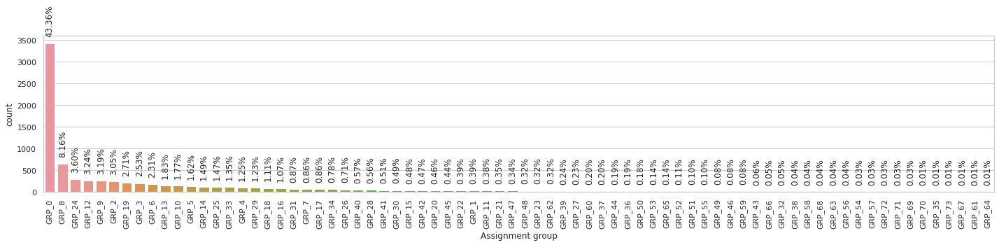

In [23]:
#Displaying the total number of tickets falling under each Assignment group with their respective percentage 

import seaborn as sns
import warnings

sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=df_updt, order=df_updt["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
 ax.annotate(str(format(p.get_height()/len(df_updt.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

plt.tight_layout()
plt.show()

*From this we can observe that Assignment group attribute is highly right skewed . Also, more than 40% of the data i.e, around 3429 records falls under Group 1 , thus implying that the dataframe is exteremly imbalance.*

In [24]:
# Displaying the top 20 Assignment groups with highest number of tickets falling under them in ascending order 

df_top_20 = df_updt['Assignment group'].value_counts().nlargest(20).reset_index()
df_top_20

,index,Assignment group
0,GRP_0,3429
1,GRP_8,645
2,GRP_24,285
3,GRP_12,256
4,GRP_9,252
5,GRP_2,241
6,GRP_19,214
7,GRP_3,200
8,GRP_6,183
9,GRP_13,145


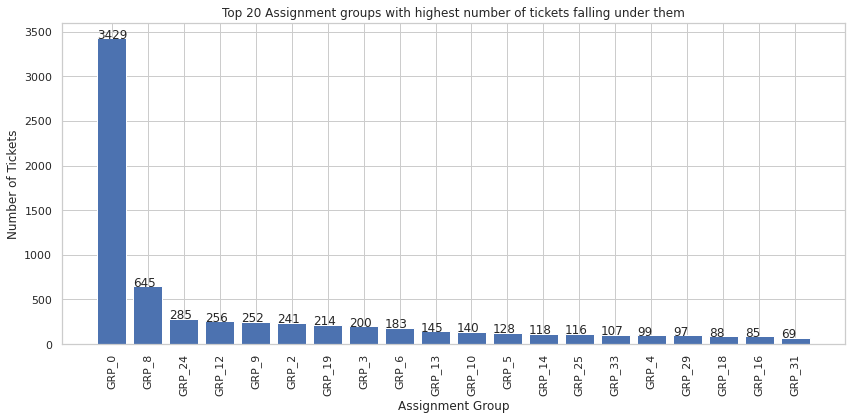

In [25]:
# Visualizing the top 20 assignment groups 

plt.figure(figsize=(12,6))
bars = plt.bar(df_top_20['index'],df_top_20['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of tickets falling under them')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()


In [26]:
# Displaying the bottom 20 Assignment groups with minimum number of tickets falling under them in descending order 

df_bottom_20 = df_updt['Assignment group'].value_counts().nsmallest(20).reset_index()
df_bottom_20

,index,Assignment group
0,GRP_70,1
1,GRP_35,1
2,GRP_73,1
3,GRP_67,1
4,GRP_61,1
5,GRP_64,1
6,GRP_54,2
7,GRP_57,2
8,GRP_72,2
9,GRP_71,2


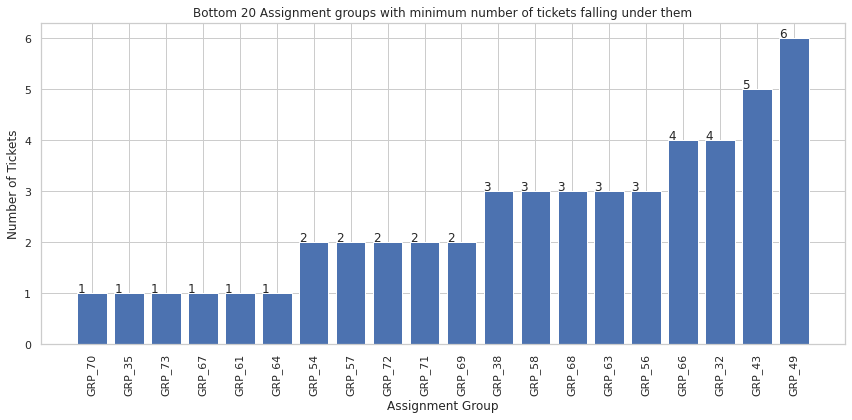

In [27]:
# Visualizing the bottom 20 assignment groups  

plt.figure(figsize=(12,6))
bars = plt.bar(df_bottom_20['index'],df_bottom_20['Assignment group'])
plt.title('Bottom 20 Assignment groups with minimum number of tickets falling under them')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()


In [28]:
# Displaying a record before cleaning the garbled data

df_updt["New Description"][186]

'é\x9d’å²›å…´å\x90ˆæœºç”µshipment notificationé‚®ç®±è®¾ç½® from:  \nsent: friday, october 28, 2016 7:20 am\nto: nwfodmhc exurcwkm\nsubject: re: é\x9d’å²›å…´å\x90ˆæœºç”µshipment notificationé‚®ç®±è®¾ç½®\n\ndearï¼Œ\npls help to update customer 4563729890 shipment notification email address :  abcdegy@gmail.com \n\n\nb. '

In [29]:
# Displaying another record before cleaning the garbled data 

df_updt["New Description"][281] 

'unable to down load ethics module  from: brdhdd dhwduw\nsent: thursday, october 27, 2016 6:12 am\nto: nwfodmhc exurcwkm\nsubject::fwd: unable to down load ethics module \n\n\nbegin forwarded message:\nfrom:  <dqwhpjxy.pozjxbey@gmail.com>\nto:  <zanivrec.capbfhur@gmail.com>\nsubject: unable to down load ethics module \nhi  â€“ trust doing well . i am unable to down load & getting below msg. i did reset resolution however still same issue persist.\n \nplease help.\n \n \n \n \n \ndirector of sales \ncompany indirect channels  - asia \n& \ndqwhpjxy.pozjxbey@gmail.com \n\n \n \n \n \n\n\n'

In [30]:
! pip install ftfy

     |████████████████████████████████| 71kB 2.1MB/s 
  Created wheel for ftfy: filename=ftfy-5.8-cp36-none-any.whl size=45612 sha256=75e7a2e0e4eb991e3863e7247564d2b7d8bef07dc16f8f78aa0281d3cbcaeec9
  Stored in directory: /root/.cache/pip/wheels/ba/c0/ef/f28c4da5ac84a4e06ac256ca9182fc34fa57fefffdbc68425b
Successfully built ftfy


In [31]:
from ftfy import *

In [32]:
val = df_updt.loc[: ,'New Description']

In [33]:
val.head()

0    login issue -verified user details.(employee# ...
1    outlook \r\n\r\nreceived from: hmjdrvpb.komuay...
2    cant log in to vpn \r\n\r\nreceived from: eylq...
3    unable to access hr_tool page unable to access...
4                            skype error  skype error 
Name: New Description, dtype: object

In [34]:
df_updt['New Description'] = val.apply(fix_text)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [35]:
#After using fify.fix_text on the given dataframe
df_updt["New Description"][186]

'青岛兴合机电shipment notification邮箱设置 from:  \nsent: friday, october 28, 2016 7:20 am\nto: nwfodmhc exurcwkm\nsubject: re: 青岛兴合机电shipment notification邮箱设置\n\ndear,\npls help to update customer 4563729890 shipment notification email address :  abcdegy@gmail.com \n\n\nb. '

In [36]:
df_updt["New Description"][281]

'unable to down load ethics module  from: brdhdd dhwduw\nsent: thursday, october 27, 2016 6:12 am\nto: nwfodmhc exurcwkm\nsubject::fwd: unable to down load ethics module \n\n\nbegin forwarded message:\nfrom:  <dqwhpjxy.pozjxbey@gmail.com>\nto:  <zanivrec.capbfhur@gmail.com>\nsubject: unable to down load ethics module \nhi  – trust doing well . i am unable to down load & getting below msg. i did reset resolution however still same issue persist.\n \nplease help.\n \n \n \n \n \ndirector of sales \ncompany indirect channels  - asia \n& \ndqwhpjxy.pozjxbey@gmail.com \n\n \n \n \n \n\n\n'

In [37]:
# Defining various function for cleaning the data 

import re  
#Remove numbers(integers)

def removeNumbers(text):
    text = ''.join([i for i in text if not i.isdigit()])         
    return text

#Replace Contractions

contraction_patterns = [ (r'won\'t', 'will not'),(r'didn\'t', 'did not'),(r'didnt', 'did not'), (r'can\'t', 'cannot'),(r'cant', 'cannot'), (r'i\'m', 'i am'), (r'ain\'t', 'is not'), (r'(\w+)\'ll', '\g<1> will'), (r'(\w+)n\'t', '\g<1> not'),
                         (r'(\w+)\'ve', '\g<1> have'), (r'(\w+)\'s', '\g<1> is'), (r'(\w+)\'re', '\g<1> are'), (r'(\w+)\'d', '\g<1> would'), (r'&', 'and'), (r'dammit', 'damn it'), (r'dont', 'do not'), (r'wont', 'will not') ]

def replaceContraction(text):
    patterns = [(re.compile(regex), repl) for (regex, repl) in contraction_patterns]
    for (pattern, repl) in patterns:
        (text, count) = re.subn(pattern, repl, text)
    return text


#Remove mail related words
       
def clean_data(text):
    text = re.sub(r"received from:",' ',text)
    text = re.sub(r"from:",' ',text)
    text = re.sub(r"to:",' ',text)
    text = re.sub(r"subject:",' ',text)
    text = re.sub(r"sent:",' ',text)
    text = re.sub(r"ic:",' ',text)
    text = re.sub(r"cc:",' ',text)
    text = re.sub(r"bcc:",' ',text)
    text = re.sub(r"hi",' ',text)
    text = re.sub(r"hello",' ',text)
    text = re.sub(r"com",' ',text)
    text = re.sub(r"gmail",' ',text)
    #Remove email 
    text = re.sub(r'\S*@\S*\s?', '', text)
    # Remove new line characters 
    text = re.sub(r'\n',' ',text)
    # Remove hashtag while keeping hashtag text
    text = re.sub(r'#','', text)
    #& 
    text = re.sub(r'&;?', 'and',text)
    # Remove HTML special entities (e.g. &amp;)
    text = re.sub(r'\&\w*;', '', text)
    # Remove hyperlinks
    text = re.sub(r'https?:\/\/.*\/\w*', '', text)  
    # Remove characters beyond Readable formart by Unicode:
    text= ''.join(c for c in text if c <= '\uFFFF') 
    text = text.strip()
    # Remove unreadable characters  (also extra spaces)
    text = ' '.join(re.sub("[^\u0030-\u0039\u0041-\u005a\u0061-\u007a]", " ", text).split())
    
    return text
  


In [38]:
def cleandata(text):
    # remove numbers
    text = removeNumbers(text)
    
    #remove punctuations
    text = re.sub(r"\W", " ", text, flags=re.I)
    text = text.replace('_',' ')
    
    #replace contractions
    text = replaceContraction(text)
      
    #convert to lower case
    text = text.lower()
    
    #remove mail related words
    text = clean_data(text)
            
    return text

In [39]:
# Applying the cleandata function to clean the dataframe

df_updt["New Description"] = val.apply(cleandata)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [40]:
#Displaying a record after the cleaning the data

df_updt["New Description"][281]

'unable to down load et cs module from brdhdd dhwduw sent thursday october am to nwfodmhc exurcwkm subject fwd unable to down load et cs module begin forwarded message from dqwhpjxy pozjxbey to zanivrec capbfhur subject unable to down load et cs module trust doing well i am unable to down load getting below msg i did reset resolution however still same issue persist please help director of sales pany indirect channels asia dqwhpjxy pozjxbey'

In [41]:
! pip install langdetect

     |████████████████████████████████| 983kB 2.6MB/s 
  Created wheel for langdetect: filename=langdetect-1.0.8-cp36-none-any.whl size=993195 sha256=ec7f7a962a5e6d91fbb12953faf3d4de985871cf0b4bc3bdc0b5de21e556eaaf
  Stored in directory: /root/.cache/pip/wheels/8d/b3/aa/6d99de9f3841d7d3d40a60ea06e6d669e8e5012e6c8b947a57
Successfully built langdetect


In [42]:
# Defining  a function for the detection of the various languages in the dataframe

from langdetect import detect
    
def fn_lan_detect(df):                                        
   try:                                                          
      return detect(df)                                      
   except:                                                       
      return 'no'                                                  

df_updt['Language'] = val.apply(fn_lan_detect)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [43]:
# Displaying the languages present in the dataframe with their respective number of record in the dataframe

df_updt["Language"].value_counts()

en    6692
de     370
af     185
no     104
it      99
fr      86
nl      63
sv      61
ca      44
es      33
pl      33
da      31
pt      17
sl      13
tl      13
ro      12
cy      11
et       7
sq       7
hr       5
fi       5
id       4
so       3
sk       2
lt       2
lv       2
cs       2
hu       1
vi       1
sw       1
Name: Language, dtype: int64

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


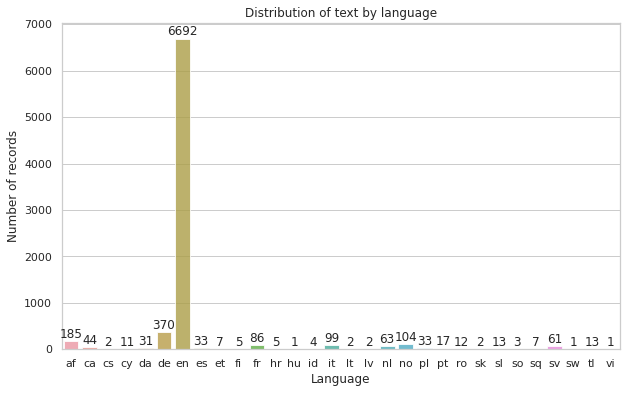

In [44]:
# Visualizing  the languages present in the dataframe with their respective number of record in the dataframe

x = df_updt["Language"].value_counts()
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Distribution of text by language")
plt.ylabel('Number of records')
plt.xlabel('Language')
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

In [45]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [46]:
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet, stopwords
stop = set(stopwords.words('english')) 
lemmatizer = WordNetLemmatizer()

# function to convert nltk tag to wordnet tag
def nltk_tag_to_wordnet_tag(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:          
        return None

def lemmatize_sentence(sentence):
    #tokenize the sentence and find the POS tag for each token
    nltk_tagged = nltk.pos_tag(nltk.word_tokenize(sentence))  
    #tuple of (token, wordnet_tag)
    wordnet_tagged = map(lambda x: (x[0], nltk_tag_to_wordnet_tag(x[1])), nltk_tagged)
    lemmatized_sentence = []
    for word, tag in wordnet_tagged:
        if tag is None:
            #if there is no available tag, append the token as is
            lemmatized_sentence.append(word)
        else:        
            #else use the tag to lemmatize the token
            lemmatized_sentence.append(lemmatizer.lemmatize(word, tag))
    return " ".join(lemmatized_sentence)

In [47]:
temp =[]
for sentence in df_updt["New Description"]:
    sentence = sentence.lower()
    l_sentence = lemmatize_sentence(sentence)
    words = [word for word in l_sentence.split() if word not in stopwords.words('english')]
    temp.append(words)
    

In [48]:
df_updt["Lemmatized clean"] = temp



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [49]:
df_updt.to_csv('/content/drive/My Drive/Assignment/df_updt_csv_file.csv')

In [50]:
df_updt.head()

,Short description,Description,Assignment group,New Description,Language,Lemmatized clean
0,login issue,-verified user details.(employee# & manager na...,GRP_0,login issue verified user details employee man...,en,"[login, issue, verify, user, detail, employee,..."
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,GRP_0,outlook received from hmjdrvpb komuaywn team m...,en,"[outlook, receive, hmjdrvpb, komuaywn, team, m..."
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,GRP_0,cannot log in to vpn received from eylqgodm yb...,en,"[log, vpn, receive, eylqgodm, ybqkwiam, log, v..."
3,unable to access hr_tool page,unable to access hr_tool page,GRP_0,unable to access hr tool page unable to access...,en,"[unable, access, hr, tool, page, unable, acces..."
4,skype error,skype error,GRP_0,skype error skype error,no,"[skype, error, skype, error]"


In [51]:
df_updt.isnull().sum()

Short description    0
Description          0
Assignment group     0
New Description      0
Language             0
Lemmatized clean     0
dtype: int64

In [52]:
from wordcloud import WordCloud
def wordcloud_grp(f, x):
    wordclouds_0=' '.join(map(str, f))

    wc = WordCloud(width=480, height=480, max_font_size=40, min_font_size=10, max_words=150).generate(wordclouds_0)
    plt.figure(figsize=(20,10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title("Most common 50 words of {}".format(x))
    plt.margins(x=0, y=0)
    plt.show()


In [53]:
value = df_updt['Assignment group'].value_counts().sort_values(ascending=False).index
value

Index(['GRP_0', 'GRP_8', 'GRP_24', 'GRP_12', 'GRP_9', 'GRP_2', 'GRP_19',
       'GRP_3', 'GRP_6', 'GRP_13', 'GRP_10', 'GRP_5', 'GRP_14', 'GRP_25',
       'GRP_33', 'GRP_4', 'GRP_29', 'GRP_18', 'GRP_16', 'GRP_31', 'GRP_7',
       'GRP_17', 'GRP_34', 'GRP_26', 'GRP_40', 'GRP_28', 'GRP_41', 'GRP_30',
       'GRP_15', 'GRP_42', 'GRP_20', 'GRP_45', 'GRP_1', 'GRP_22', 'GRP_11',
       'GRP_21', 'GRP_47', 'GRP_48', 'GRP_23', 'GRP_62', 'GRP_39', 'GRP_27',
       'GRP_60', 'GRP_37', 'GRP_36', 'GRP_44', 'GRP_50', 'GRP_53', 'GRP_65',
       'GRP_52', 'GRP_51', 'GRP_55', 'GRP_46', 'GRP_59', 'GRP_49', 'GRP_43',
       'GRP_66', 'GRP_32', 'GRP_38', 'GRP_58', 'GRP_68', 'GRP_63', 'GRP_56',
       'GRP_54', 'GRP_57', 'GRP_72', 'GRP_71', 'GRP_69', 'GRP_73', 'GRP_67',
       'GRP_61', 'GRP_35', 'GRP_70', 'GRP_64'],
      dtype='object')

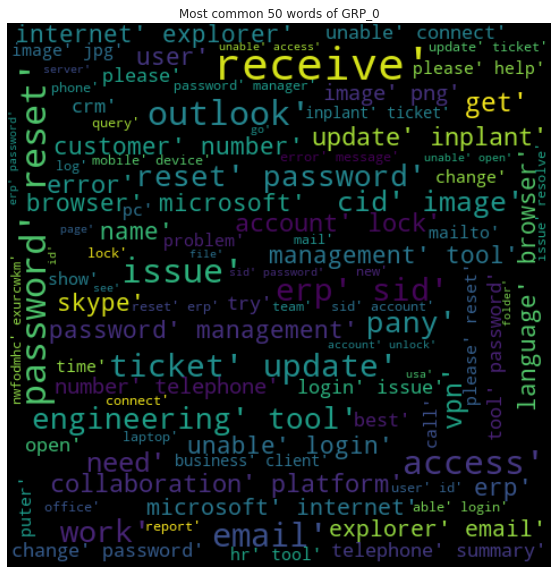

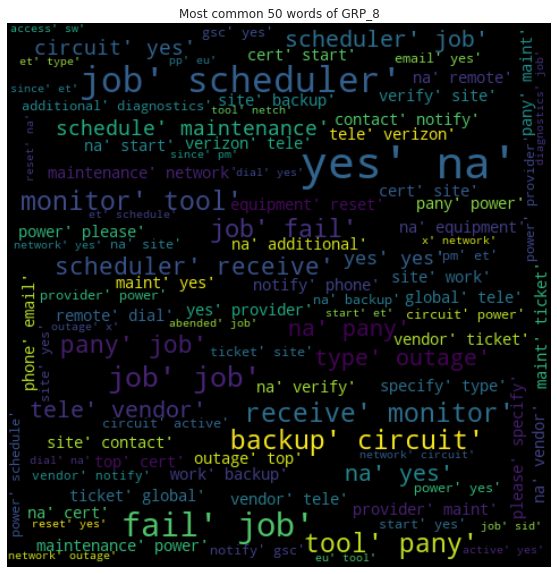

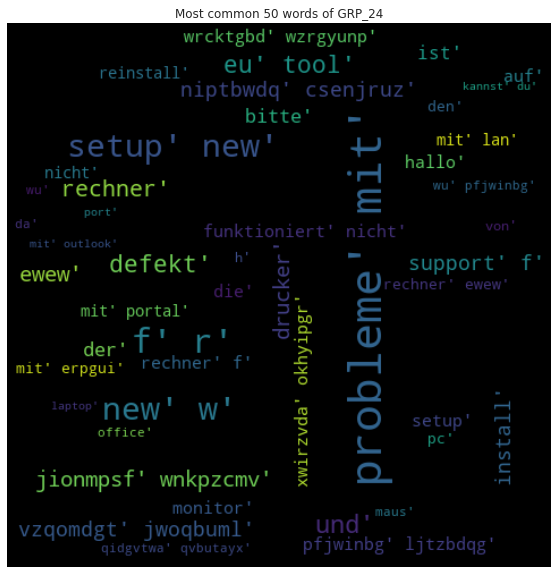

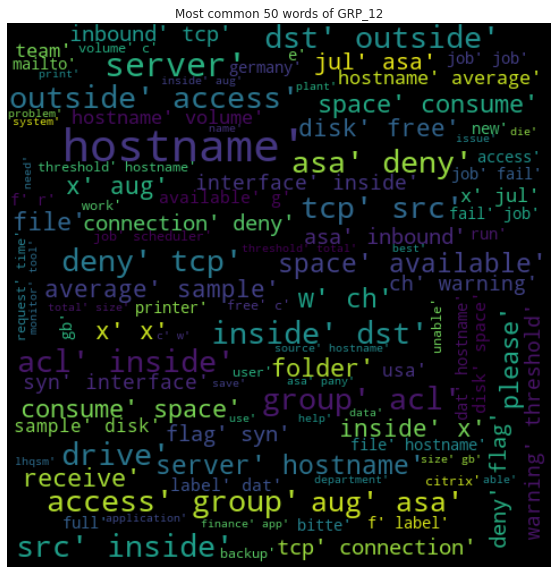

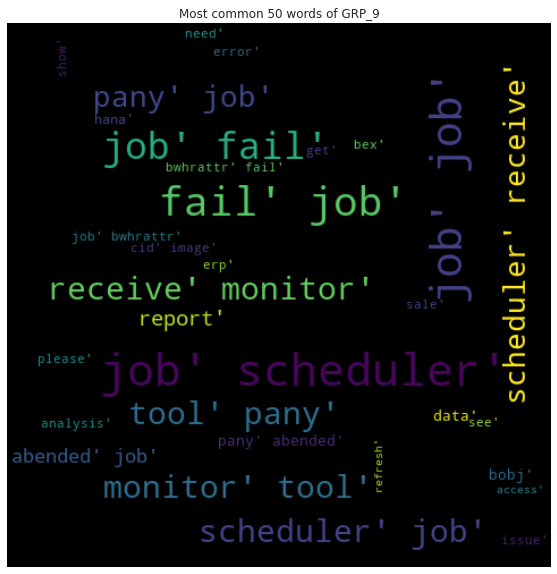

...

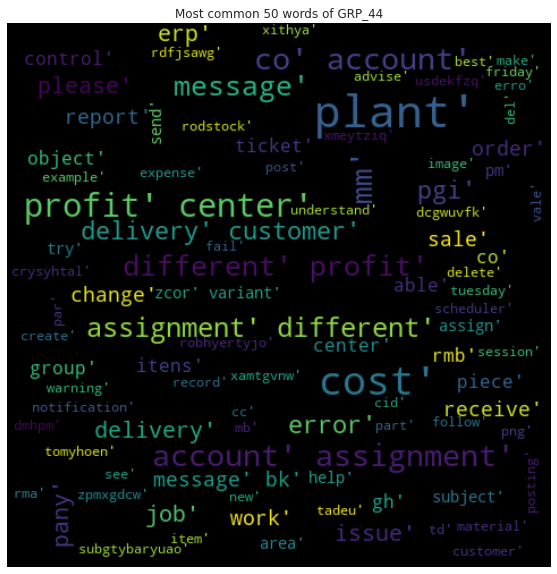

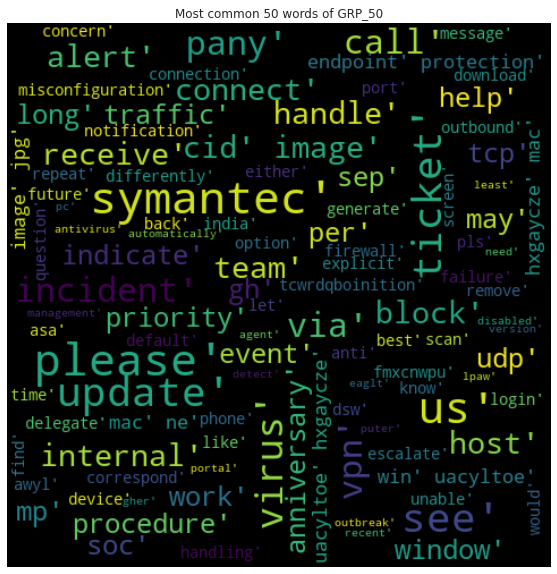

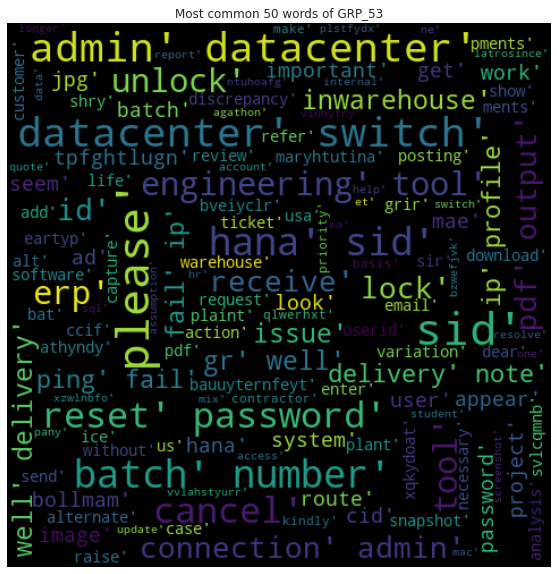

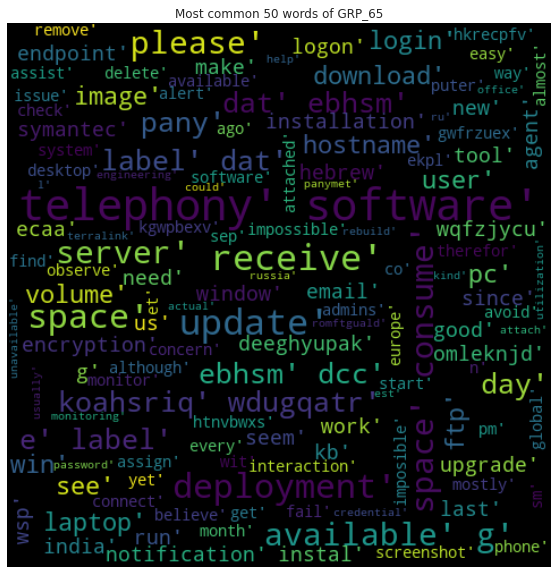

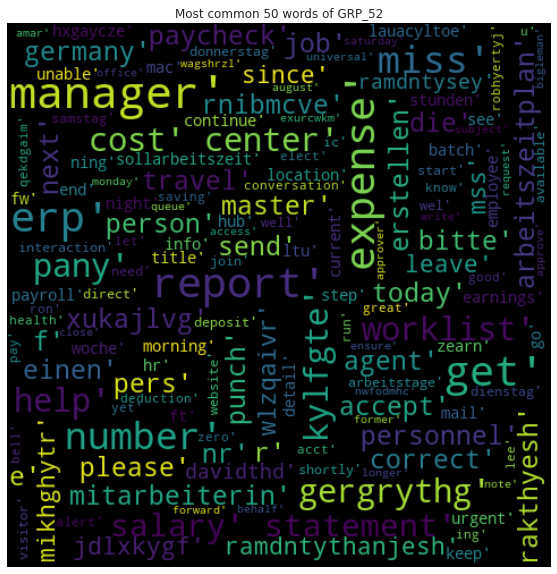

In [54]:
for i in range(50):

    Grp = df_updt[df_updt['Assignment group'] == value[i]]
    Grp = Grp['Lemmatized clean']
    wordcloud_grp(Grp,value[i])

In [55]:
max_features = 10000
maxlen = 25

In [56]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer(num_words=max_features, split=' ')
tokenizer.fit_on_texts(df_updt["New Description"].values)
X = tokenizer.texts_to_sequences(df_updt["New Description"].values)

In [57]:
sequences = tokenizer.texts_to_sequences(df_updt["New Description"].values)
X = pad_sequences(sequences, maxlen = maxlen)

print(len(X))


7909


In [58]:
tokenizer.word_index

{'to': 1,
 'the': 2,
 'in': 3,
 'job': 4,
 'from': 5,
 'is': 6,
 'no': 7,
 'not': 8,
 'on': 9,
 'pany': 10,
 'i': 11,
 'and': 12,
 'for': 13,
 'tool': 14,
 'a': 15,
 's': 16,
 'at': 17,
 'received': 18,
 'please': 19,
 't': 20,
 'yes': 21,
 'na': 22,
 'password': 23,
 'scheduler': 24,
 'erp': 25,
 'of': 26,
 'it': 27,
 'failed': 28,
 'sid': 29,
 'access': 30,
 'user': 31,
 'unable': 32,
 'issue': 33,
 'reset': 34,
 'ticket': 35,
 'my': 36,
 'with': 37,
 'you': 38,
 'have': 39,
 'error': 40,
 'hostname': 41,
 'monitoring': 42,
 'can': 43,
 'e': 44,
 'am': 45,
 'are': 46,
 'email': 47,
 'outlook': 48,
 'be': 49,
 'account': 50,
 'working': 51,
 'site': 52,
 'we': 53,
 'that': 54,
 'f': 55,
 'help': 56,
 'when': 57,
 'as': 58,
 'need': 59,
 'system': 60,
 'circuit': 61,
 'id': 62,
 'power': 63,
 'name': 64,
 'login': 65,
 'network': 66,
 'an': 67,
 'but': 68,
 'vendor': 69,
 'was': 70,
 'has': 71,
 'c': 72,
 'et': 73,
 'x': 74,
 'or': 75,
 'update': 76,
 'if': 77,
 'd': 78,
 'by': 79,
 'd

In [59]:
df_to_process = df_updt.copy()

In [60]:
df_to_process.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7909 entries, 0 to 8499
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  7909 non-null   object
 1   Description        7909 non-null   object
 2   Assignment group   7909 non-null   object
 3   New Description    7909 non-null   object
 4   Language           7909 non-null   object
 5   Lemmatized clean   7909 non-null   object
dtypes: object(6)
memory usage: 752.5+ KB


In [61]:
df_to_process.drop(["Short description", "Description", "Language"],axis=1,inplace=True)

In [62]:
df_to_process.head(5)

,Assignment group,New Description,Lemmatized clean
0,GRP_0,login issue verified user details employee man...,"[login, issue, verify, user, detail, employee,..."
1,GRP_0,outlook received from hmjdrvpb komuaywn team m...,"[outlook, receive, hmjdrvpb, komuaywn, team, m..."
2,GRP_0,cannot log in to vpn received from eylqgodm yb...,"[log, vpn, receive, eylqgodm, ybqkwiam, log, v..."
3,GRP_0,unable to access hr tool page unable to access...,"[unable, access, hr, tool, page, unable, acces..."
4,GRP_0,skype error skype error,"[skype, error, skype, error]"


In [63]:

# We will use applymap() as it works element-wise on a DataFrame, whereas apply() works on a row / column basis of a DataFrame
df_to_process1 = df_to_process.applymap(str)

In [64]:
# Adding Word count and Description Length
df_to_process1['clean_review_len'] =df_to_process1['New Description'].astype(str).apply(len)
df_to_process1['clean_word_count'] = df_to_process1['New Description'].apply(lambda x: len(str(x).split()))

In [65]:
df_to_process1.head()

,Assignment group,New Description,Lemmatized clean,clean_review_len,clean_word_count
0,GRP_0,login issue verified user details employee man...,"['login', 'issue', 'verify', 'user', 'detail',...",200,35
1,GRP_0,outlook received from hmjdrvpb komuaywn team m...,"['outlook', 'receive', 'hmjdrvpb', 'komuaywn',...",167,28
2,GRP_0,cannot log in to vpn received from eylqgodm yb...,"['log', 'vpn', 'receive', 'eylqgodm', 'ybqkwia...",80,16
3,GRP_0,unable to access hr tool page unable to access...,"['unable', 'access', 'hr', 'tool', 'page', 'un...",59,12
4,GRP_0,skype error skype error,"['skype', 'error', 'skype', 'error']",23,4


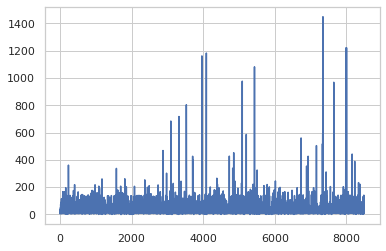

In [66]:

# Word Count Distribution for Description
df_to_process1['clean_word_count'].plot(
    x='word_count',
    y='count')

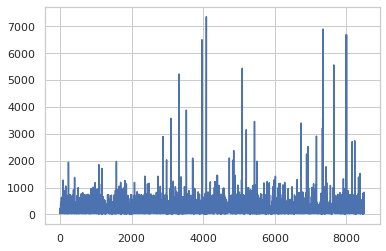

In [67]:
# Description Length Distribution
df_to_process1['clean_review_len'].plot(
    x='review length',
    y='count')

In [68]:
# The distribution of top unigrams before removing stop words for New Description

from sklearn.feature_extraction.text import CountVectorizer


def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]



common_words = get_top_n_words(df_to_process1['New Description'], 20)
for word, freq in common_words:
    print(word, freq)

to 8248
the 6856
in 5155
job 4952
from 3545
is 3526
no 2991
not 2948
on 2935
pany 2755
and 2687
for 2626
tool 2611
at 2466
received 2363
please 2181
yes 2027
na 2022
password 1950
scheduler 1888


In [69]:
# The distribution of top unigrams after removing stop words for New Description

def get_top_n_words(corpus, range=(1,1), n=None):
    vec = CountVectorizer(ngram_range=range, stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]


common_words = get_top_n_words(df_to_process1['New Description'], (1,1),20)
for word, freq in common_words:
    print(word, freq)

job 4952
pany 2755
tool 2611
received 2363
yes 2027
na 2022
password 1950
scheduler 1888
erp 1852
failed 1695
sid 1440
access 1413
user 1382
unable 1281
issue 1242
reset 1209
ticket 1196
error 983
hostname 981
monitoring 976


In [70]:
# The distribution of top bigrams after removing stop words for New Description

common_words = get_top_n_words(df_to_process1['New Description'], (2,2),20)
for word, freq in common_words:
    print(word, freq)

job scheduler 1888
failed job 1574
yes na 1570
job job 1240
monitoring tool 967
tool pany 953
received monitoring 939
job failed 920
scheduler received 783
pany job 765
password reset 488
cid image 478
backup circuit 441
engineering tool 409
erp sid 357
collaboration platform 338
tele vendor 325
abended job 300
ticket update 294
na pany 290


In [71]:
# The distribution of top trigrams after removing stop words for New Description

common_words = get_top_n_words(df_to_process1['New Description'], (3,3) ,20)
for word, freq in common_words:
    print(word, freq)

failed job scheduler 1574
received monitoring tool 939
monitoring tool pany 939
job job failed 918
job failed job 918
job scheduler received 783
scheduler received monitoring 783
tool pany job 765
pany job job 454
job job scheduler 300
abended job job 298
yes na pany 285
na yes na 285
cid image png 270
password management tool 255
backup circuit yes 242
yes yes na 231
cid image jpg 208
src inside dst 185
access group acl 185


In [72]:
df_to_process1.shape

(7909, 5)

In [73]:
def wordTokenizer(dataframe):
    tokenizer = Tokenizer(num_words=numWords,filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True,split=' ', char_level=False)
    tokenizer.fit_on_texts(dataframe)
    dataframe = tokenizer.texts_to_sequences(dataframe)
    return tokenizer,dataframe
    

In [74]:
from sklearn import preprocessing 
  
label_encoder = preprocessing.LabelEncoder() 
  
df_to_process['Assignment group ID']= label_encoder.fit_transform(df_to_process['Assignment group']) 
df_to_process['Assignment group ID'].unique()

array([ 0,  1, 23, 34, 45, 56, 67, 72, 73,  2,  3,  4,  5,  6,  7,  8,  9,
       10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 27, 28,
       29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47,
       48, 49, 50, 51, 52, 53, 54, 55, 57, 58, 26, 59, 60, 61, 62, 63, 64,
       65, 66, 68, 69, 70, 71])

In [75]:
label_encoded_dict = dict(zip(df_to_process1['Assignment group'].unique(), df_to_process['Assignment group ID'].unique()))

In [76]:
! pip install pyLDAvis

     |████████████████████████████████| 1.6MB 2.8MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97712 sha256=76845b4f863f8affd1a9fc02daddabf316dbec5e336a2853e162eec0745807d5
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
Successfully built pyLDAvis


In [77]:
import gensim
import gensim.corpora as corpora
#Remove stemming(snowball stemming) add lemmatistaion using simple_process from gensim 
from gensim.utils import simple_preprocess
from gensim.models.ldamodel import LdaModel
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this 
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [78]:
#to process the simple_process gensim package as input needed as string
combined_text=df_to_process1['New Description'].tolist()

In [79]:
combined_text[1]

'outlook received from hmjdrvpb komuaywn team my meetings skype meetings etc are not appearing in my outlook calendar can somebody please advise how to correct t s kind'

In [80]:

#Convert  Combined text from each sentense to the words. use of simple_process as it tokenize() internally
#https://radimrehurek.com/gensim/utils.html#gensim.utils.simple_preprocess
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(combined_text))

In [81]:

print(data_words[1])

['outlook', 'received', 'from', 'hmjdrvpb', 'komuaywn', 'team', 'my', 'meetings', 'skype', 'meetings', 'etc', 'are', 'not', 'appearing', 'in', 'my', 'outlook', 'calendar', 'can', 'somebody', 'please', 'advise', 'how', 'to', 'correct', 'kind']


In [82]:

# Build the bigram and trigram models
#https://radimrehurek.com/gensim/models/phrases.html
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

/usr/local/lib/python3.6/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


In [83]:
print(bigram_mod[data_words[1]])

['outlook', 'received', 'from', 'hmjdrvpb', 'komuaywn', 'team', 'my', 'meetings', 'skype', 'meetings', 'etc', 'are', 'not', 'appearing', 'in', 'my', 'outlook', 'calendar', 'can', 'somebody', 'please', 'advise', 'how', 'to', 'correct', 'kind']


In [84]:
# See trigram example
print(trigram_mod[bigram_mod[data_words[1]]])

['outlook', 'received', 'from', 'hmjdrvpb', 'komuaywn', 'team', 'my', 'meetings', 'skype', 'meetings', 'etc', 'are', 'not', 'appearing', 'in', 'my', 'outlook', 'calendar', 'can', 'somebody', 'please', 'advise', 'how', 'to', 'correct', 'kind']


In [85]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

In [86]:
# Form Bigrams
data_words_bigrams = make_bigrams(data_words)

In [87]:
print(data_words_bigrams[1])

['outlook', 'received', 'from', 'hmjdrvpb', 'komuaywn', 'team', 'my', 'meetings', 'skype', 'meetings', 'etc', 'are', 'not', 'appearing', 'in', 'my', 'outlook', 'calendar', 'can', 'somebody', 'please', 'advise', 'how', 'to', 'correct', 'kind']


In [88]:
wordclouds=' '.join(map(str, data_words_bigrams))

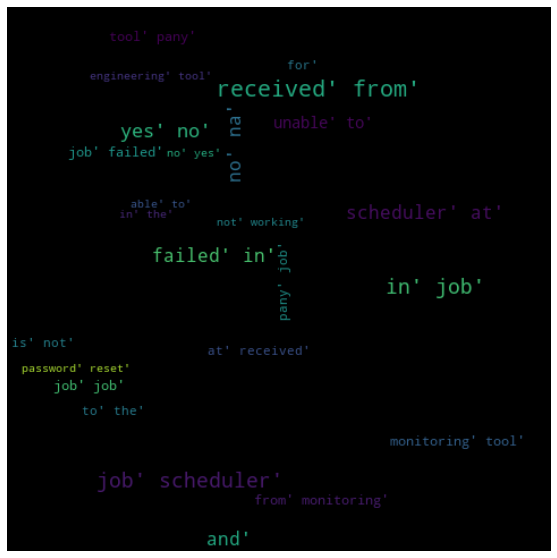

In [89]:
wordcloud = WordCloud(width=480, height=480, max_font_size=20, min_font_size=10).generate(wordclouds)
plt.figure(figsize=(20,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()

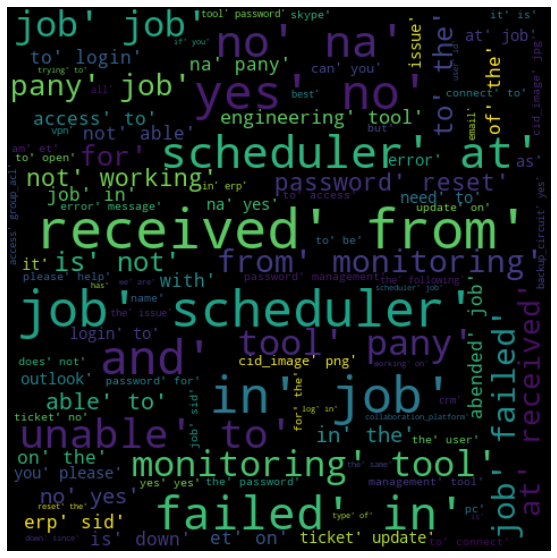

In [90]:

wordcloud_2 = WordCloud(width=480, height=480, max_words=100).generate(wordclouds)
plt.figure(figsize=(10,10))
plt.imshow(wordcloud_2, interpolation="bilinear")
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()

In [91]:
new_df = df_to_process1.copy()
new_df['words'] = data_words_bigrams
new_df.head()

,Assignment group,New Description,Lemmatized clean,clean_review_len,clean_word_count,words
0,GRP_0,login issue verified user details employee man...,"['login', 'issue', 'verify', 'user', 'detail',...",200,35,"[login, issue, verified, user, details, employ..."
1,GRP_0,outlook received from hmjdrvpb komuaywn team m...,"['outlook', 'receive', 'hmjdrvpb', 'komuaywn',...",167,28,"[outlook, received, from, hmjdrvpb, komuaywn, ..."
2,GRP_0,cannot log in to vpn received from eylqgodm yb...,"['log', 'vpn', 'receive', 'eylqgodm', 'ybqkwia...",80,16,"[cannot, log, in, to, vpn, received, from, eyl..."
3,GRP_0,unable to access hr tool page unable to access...,"['unable', 'access', 'hr', 'tool', 'page', 'un...",59,12,"[unable, to, access, hr, tool, page, unable, t..."
4,GRP_0,skype error skype error,"['skype', 'error', 'skype', 'error']",23,4,"[skype, error, skype, error]"


In [92]:
maxlen = 150
numWords = 9000
tokenizer,X = wordTokenizer(df_to_process['New Description'])
y = np.asarray(df_to_process['Assignment group'])
X = pad_sequences(X, maxlen = maxlen)

In [93]:
# For BoW we are using CountVectorizer for creating Document Vectors
from sklearn.feature_extraction.text import CountVectorizer

CV = CountVectorizer(max_features = 2000)

X_BoW = CV.fit_transform(df_to_process['New Description']).toarray()
y = df_to_process['Assignment group ID']

print("Shape of Input Feature :",np.shape(X_BoW))
print("Shape of Target Feature :",np.shape(y))

Shape of Input Feature : (7909, 2000)
Shape of Target Feature : (7909,)


In [94]:
# Splitting Train Test 
from sklearn.model_selection import train_test_split

train_x, test_x, train_y, test_y = train_test_split(X_BoW, y, test_size=0.3, random_state = 5)

In [95]:
from sklearn.svm import SVC

svm_clf = SVC(kernel='linear').fit(train_x, train_y)
y_pred = svm_clf.predict(test_x)

In [96]:
from sklearn.metrics import accuracy_score, f1_score

acc_score = accuracy_score(test_y, y_pred)
print("SVM-Linear Score for BoW Model is ", acc_score)

f_sc = f1_score(test_y, y_pred, average='weighted', labels=np.unique(y_pred))
print("SVM F1 Score for BoW Model is ", f_sc)

SVM-Linear Score for BoW Model is  0.627897176569743
SVM F1 Score for BoW Model is  0.6124185889559783


In [97]:
maxlen = 300
numWords = 9000
tokenizer,X = wordTokenizer(df_to_process1['New Description'])
X = pad_sequences(X, maxlen = maxlen)

In [98]:
y = df_to_process['Assignment group ID']

In [99]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)


In [100]:
X_train.shape,X_test.shape

((5536, 300), (2373, 300))

In [101]:
y_train.shape, y_test.shape

((5536,), (2373,))

In [102]:
vocab_size = len(tokenizer.word_index) + 1

In [103]:
num_class = len(np.unique(df_to_process['Assignment group ID'].values))

In [104]:
from keras.utils import to_categorical

In [105]:
import keras 

from keras.preprocessing.text import Tokenizer

from keras.models import Sequential
from keras.layers import Dense
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, Dense, Dropout, Embedding, LSTM, Flatten
from keras.models import Model
from keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [106]:
inputs = Input(shape=(maxlen, ))
embedding_layer = Embedding(vocab_size,
                            128,
                            input_length=maxlen)(inputs)

x = LSTM(64)(embedding_layer)
x = Dense(32, activation='relu')(x)
predictions = Dense(num_class, activation='softmax')(x)
model = Model(inputs=[inputs], outputs=predictions)
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])

model.summary()
filepath="weights.hdf5"
checkpointer = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
history = model.fit([X_train], batch_size=64, y=to_categorical(y_train), verbose=1, validation_split=0.3, 
          shuffle=True, epochs=10, callbacks=[checkpointer])

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 300)]             0         
_________________________________________________________________
embedding (Embedding)        (None, 300, 128)          1969792   
_________________________________________________________________
lstm (LSTM)                  (None, 64)                49408     
_________________________________________________________________
dense (Dense)                (None, 32)                2080      
_________________________________________________________________
dense_1 (Dense)              (None, 74)                2442      
Total params: 2,023,722
Trainable params: 2,023,722
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
61/61 [==============================] - ETA: 0s - loss: 3.2826 - acc: 0.4199
Epoch 00001: val_acc 

In [107]:
predicted = model.predict(X_test)
predicted = np.argmax(predicted, axis=1)
accuracy_score(y_test, predicted)

0.5663716814159292

In [108]:
df_to_process.head()

,Assignment group,New Description,Lemmatized clean,Assignment group ID
0,GRP_0,login issue verified user details employee man...,"[login, issue, verify, user, detail, employee,...",0
1,GRP_0,outlook received from hmjdrvpb komuaywn team m...,"[outlook, receive, hmjdrvpb, komuaywn, team, m...",0
2,GRP_0,cannot log in to vpn received from eylqgodm yb...,"[log, vpn, receive, eylqgodm, ybqkwiam, log, v...",0
3,GRP_0,unable to access hr tool page unable to access...,"[unable, access, hr, tool, page, unable, acces...",0
4,GRP_0,skype error skype error,"[skype, error, skype, error]",0


In [109]:
df4=df_to_process

In [110]:
df6 =df4[df4['Assignment group'] != 'GRP_0']

In [111]:
df6.head()

,Assignment group,New Description,Lemmatized clean,Assignment group ID
6,GRP_1,event critical hostname pany the value of moun...,"[event, critical, hostname, pany, value, mount...",1
17,GRP_3,when undocking pc screen will not e back when ...,"[undocking, pc, screen, e, back, undocking, pc...",23
32,GRP_4,duplication of network address received from k...,"[duplication, network, address, receive, kxsce...",34
43,GRP_5,please reroute jobs on printer to printer issu...,"[please, reroute, job, printer, printer, issue...",45
47,GRP_6,job job failed in job scheduler at received fr...,"[job, job, fail, job, scheduler, receive, moni...",56


In [112]:
df5 =df4[df4['Assignment group'] == 'GRP_0']

In [113]:
df5.head()

,Assignment group,New Description,Lemmatized clean,Assignment group ID
0,GRP_0,login issue verified user details employee man...,"[login, issue, verify, user, detail, employee,...",0
1,GRP_0,outlook received from hmjdrvpb komuaywn team m...,"[outlook, receive, hmjdrvpb, komuaywn, team, m...",0
2,GRP_0,cannot log in to vpn received from eylqgodm yb...,"[log, vpn, receive, eylqgodm, ybqkwiam, log, v...",0
3,GRP_0,unable to access hr tool page unable to access...,"[unable, access, hr, tool, page, unable, acces...",0
4,GRP_0,skype error skype error,"[skype, error, skype, error]",0


In [114]:
df5.isnull().sum()

Assignment group       0
New Description        0
Lemmatized clean       0
Assignment group ID    0
dtype: int64

In [115]:
df5.shape


(3429, 4)

In [116]:
from gensim.models import Word2Vec
from sklearn.cluster import KMeans
from sklearn import cluster 
from sklearn import metrics
from sklearn.decomposition import PCA
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering

In [117]:
m=Word2Vec(df5["New Description"],size=200,min_count=1,sg=1)
def vectorizer(sent,m):
    vec=[]
    numw=0
    for w in sent:
        try:
            if numw==0:
                vec=m[w]
            else:
                vec=np.add(vec,m[w])
            numw+=1
        except:
            pass

        return np.asarray(vec)/numw
l=[]
for i in df5["New Description"]:
    l.append(vectorizer(i,m))
X=np.array(l)

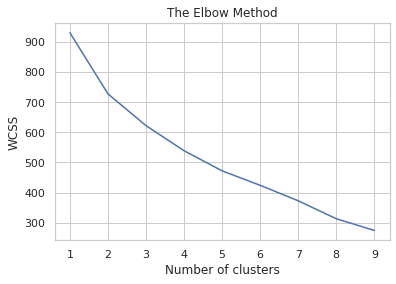

In [118]:
import matplotlib.pyplot as plt
wcss=[]
for i in range(1,10):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,10),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [119]:
n_clusters=7
clf=KMeans(n_clusters=n_clusters, max_iter=100,init='k-means++',n_init=1)
labels=clf.fit_predict(X)
print(labels)
for index, sen in enumerate(df5['New Description']):
    print(str(labels[index])+":"+str(sen))

[3 1 6 ... 2 3 5]
3:login issue verified user details employee manager name checked the user name in ad and reset the password advised the user to login and check caller confirmed that he was able to login issue resolved
1:outlook received from hmjdrvpb komuaywn team my meetings skype meetings etc are not appearing in my outlook calendar can somebody please advise how to correct t s kind
6:cannot log in to vpn received from eylqgodm ybqkwiam i cannot log on to vpn best
0:unable to access hr tool page unable to access hr tool page
4:skype error skype error
0:unable to log in to engineering tool and skype unable to log in to engineering tool and skype
3:ticket no employment status new non employee enter user s name ticket no employment status new non employee enter user s name
0:unable to disable add ins on outlook unable to disable add ins on outlook
3:ticket update on inplant ticket update on inplant
1:engineering tool says not connected and unable to submit reports engineering tool sa

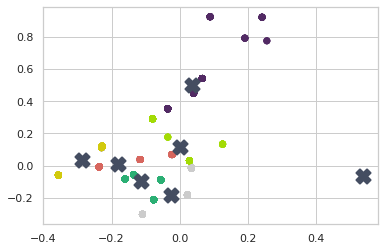

In [120]:
pca=PCA(n_components=5).fit(X)
coords=pca.transform(X)
label_colors=["#2AB0E9", "#2BAF74","#D7665E","#CCCCCC","#D2CA0D","#522A64","#A3DB05","#FC6514"]
colors=[label_colors[i] for i in labels]
plt.scatter(coords[:,0],coords[:,1],c=colors)
centroids=clf.cluster_centers_
centroids_coords=pca.transform(centroids)
plt.scatter(centroids_coords[:,0],centroids_coords[:,1],marker='X',s=200,linewidths=2,c="#444d61")

In [121]:
df5["New Assignment group"]="0"

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [122]:
df5["New Assignment group"].value_counts().to_list()

[3429]

In [123]:

a=0
for index_label, row in df5.iterrows():
    df5.at[index_label,'New Assignment group'] = "GRP_0"+"_"+str(labels[a])
    a=a+1
print(a)

3429


In [124]:
df5.head()

,Assignment group,New Description,Lemmatized clean,Assignment group ID,New Assignment group
0,GRP_0,login issue verified user details employee man...,"[login, issue, verify, user, detail, employee,...",0,GRP_0_3
1,GRP_0,outlook received from hmjdrvpb komuaywn team m...,"[outlook, receive, hmjdrvpb, komuaywn, team, m...",0,GRP_0_1
2,GRP_0,cannot log in to vpn received from eylqgodm yb...,"[log, vpn, receive, eylqgodm, ybqkwiam, log, v...",0,GRP_0_6
3,GRP_0,unable to access hr tool page unable to access...,"[unable, access, hr, tool, page, unable, acces...",0,GRP_0_0
4,GRP_0,skype error skype error,"[skype, error, skype, error]",0,GRP_0_4


In [125]:
df5["New Assignment group"].unique().tolist()

['GRP_0_3', 'GRP_0_1', 'GRP_0_6', 'GRP_0_0', 'GRP_0_4', 'GRP_0_2', 'GRP_0_5']

Text(0.5, 1.0, 'After subgrouping GRP_0 via KMeans Clustering')

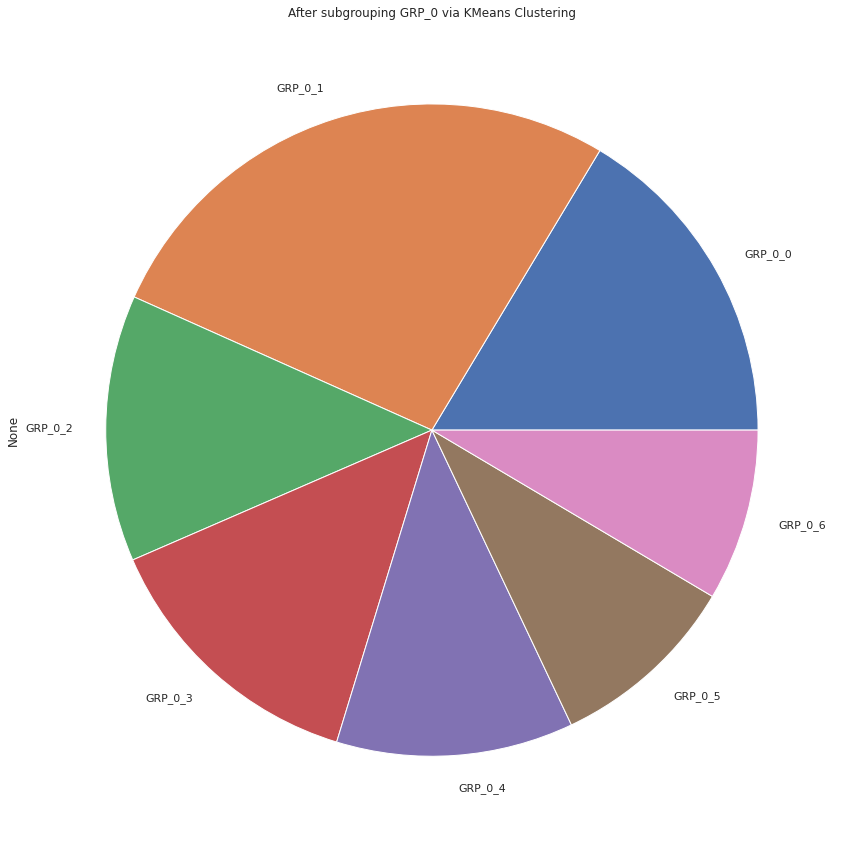

In [126]:
plt.figure(figsize=(15,15))
sub_GRP_0_df = df5.groupby('New Assignment group').size()
sub_GRP_0_df.plot.pie()
plt.title('After subgrouping GRP_0 via KMeans Clustering')

In [127]:
df5['Assignment group']=df5["New Assignment group"]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [128]:
df5.drop('New Assignment group', axis=1, inplace = True)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4169: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [129]:
final_df = pd.concat([df6, df5], axis = 0)

In [130]:
final_df.head(5)

,Assignment group,New Description,Lemmatized clean,Assignment group ID
6,GRP_1,event critical hostname pany the value of moun...,"[event, critical, hostname, pany, value, mount...",1
17,GRP_3,when undocking pc screen will not e back when ...,"[undocking, pc, screen, e, back, undocking, pc...",23
32,GRP_4,duplication of network address received from k...,"[duplication, network, address, receive, kxsce...",34
43,GRP_5,please reroute jobs on printer to printer issu...,"[please, reroute, job, printer, printer, issue...",45
47,GRP_6,job job failed in job scheduler at received fr...,"[job, job, fail, job, scheduler, receive, moni...",56


In [131]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7909 entries, 6 to 8497
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Assignment group     7909 non-null   object
 1   New Description      7909 non-null   object
 2   Lemmatized clean     7909 non-null   object
 3   Assignment group ID  7909 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 308.9+ KB


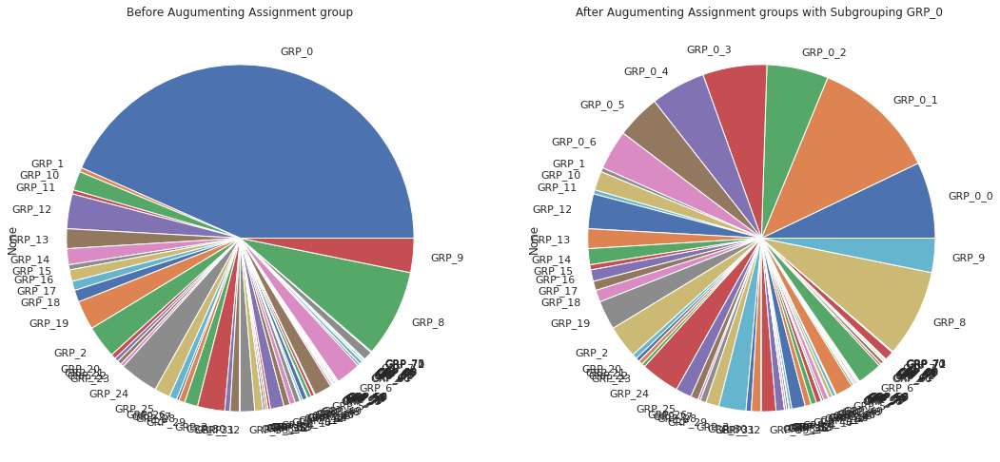

In [132]:
plt.figure(figsize=(18,18))

plt.subplot(1, 2, 1)
pre_GRP_treatment_df = df4.groupby('Assignment group').size()
pre_GRP_treatment_df.plot.pie()
plt.title('Before Augumenting Assignment group')

plt.subplot(1, 2, 2)
post_GRP_treatment_df = final_df.groupby('Assignment group').size()
post_GRP_treatment_df.plot.pie()

plt.title('After Augumenting Assignment groups with Subgrouping GRP_0 ')
plt.show()

In [133]:
final_df['Assignment group'].unique()

array(['GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7', 'GRP_8',
       'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
       'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
       'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
       'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
       'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
       'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
       'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
       'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73',
       'GRP_0_3', 'GRP_0_1', 'GRP_0_6', 'GRP_0_0', 'GRP_0_4', 'GRP_0_2',
       'GRP_0_5'], dtype=object)

In [134]:
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'species'. 
final_df['Assignment group LabelEncode']= label_encoder.fit_transform(final_df['Assignment group']) 

final_df['Assignment group LabelEncode'].unique()

array([ 7, 29, 40, 51, 62, 73, 78, 79,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 33, 34, 35,
       36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54,
       55, 56, 57, 58, 59, 60, 61, 63, 64, 32, 65, 66, 67, 68, 69, 70, 71,
       72, 74, 75, 76, 77,  3,  1,  6,  0,  4,  2,  5])

In [135]:
label_encoded_dict = dict(zip(final_df['Assignment group'].unique(), final_df['Assignment group LabelEncode'].unique()))

In [136]:
len(label_encoded_dict)

80

In [137]:
def wordTokenizer(dataframe):
    tokenizer = Tokenizer(num_words=numWords,filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True,split=' ', char_level=False)
    tokenizer.fit_on_texts(dataframe)
    dataframe = tokenizer.texts_to_sequences(dataframe)
    return tokenizer,dataframe

In [138]:
maxlen = 150
numWords = 9000
tokenizer,X = wordTokenizer(final_df['New Description'])
y = final_df['Assignment group LabelEncode']
X = pad_sequences(X, maxlen = maxlen)

print("Number of Samples:", len(X))
print("Number of Labels: ", len(y))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
print("Number of train Samples:", len(X_train))
print("Number of val Samples:", len(X_test))

Number of Samples: 7909
Number of Labels:  7909
Number of train Samples: 6327
Number of val Samples: 1582


In [139]:
final_df.head()

,Assignment group,New Description,Lemmatized clean,Assignment group ID,Assignment group LabelEncode
6,GRP_1,event critical hostname pany the value of moun...,"[event, critical, hostname, pany, value, mount...",1,7
17,GRP_3,when undocking pc screen will not e back when ...,"[undocking, pc, screen, e, back, undocking, pc...",23,29
32,GRP_4,duplication of network address received from k...,"[duplication, network, address, receive, kxsce...",34,40
43,GRP_5,please reroute jobs on printer to printer issu...,"[please, reroute, job, printer, printer, issue...",45,51
47,GRP_6,job job failed in job scheduler at received fr...,"[job, job, fail, job, scheduler, receive, moni...",56,62


In [143]:
from sklearn import svm

In [149]:
clf = svm.SVC(gamma='auto',probability=False)    

In [150]:
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)


In [151]:

acc_score = accuracy_score(y_test, y_pred)
print("SVM-Linear Score for sampled Model is ", acc_score)

f_sc = f1_score(y_test, y_pred, average='weighted', labels=np.unique(y_pred))
print("SVM F1 Score for sampled Model is ", f_sc)

SVM-Linear Score for sampled Model is  0.22187104930467763
SVM F1 Score for sampled Model is  0.23639178929623778


In [156]:
maxlen = 300
numWords = 9000
tokenizer,X = wordTokenizer(final_df['New Description'])
y = final_df['Assignment group LabelEncode']
X = pad_sequences(X, maxlen = maxlen)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

In [157]:
X_train.shape,X_test.shape
y_train.shape,y_test.shape

((5536,), (2373,))

In [158]:
vocab_size = len(tokenizer.word_index) + 1

In [159]:
num_class = len(np.unique(final_df['Assignment group LabelEncode'].values))

In [160]:
inputs = Input(shape=(maxlen, ))
embedding_layer = Embedding(vocab_size,
                            128,
                            input_length=maxlen)(inputs)

x = LSTM(64)(embedding_layer)
x = Dense(32, activation='relu')(x)
predictions = Dense(num_class, activation='softmax')(x)
model = Model(inputs=[inputs], outputs=predictions)
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])

              

model.summary()
filepath="weights.hdf5"
checkpointer = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
history = model.fit([X_train], batch_size=64, y=to_categorical(y_train), verbose=1, validation_split=0.3, 
          shuffle=True, epochs=10, callbacks=[checkpointer])

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 300)]             0         
_________________________________________________________________
embedding_3 (Embedding)      (None, 300, 128)          1969792   
_________________________________________________________________
lstm_3 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dense_6 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_7 (Dense)              (None, 80)                2640      
Total params: 2,023,920
Trainable params: 2,023,920
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
61/61 [==============================] - ETA: 0s - loss: 3.8306 - acc: 0.1218
Epoch 00001: val_acc 

In [161]:
predicted = model.predict(X_test)
predicted = np.argmax(predicted, axis=1)
accuracy_score(y_test, predicted)

0.3282764433206911

In [163]:
from imblearn.over_sampling import RandomOverSampler

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [167]:
df6.head()

,Assignment group,New Description,Lemmatized clean,Assignment group ID
6,GRP_1,event critical hostname pany the value of moun...,"[event, critical, hostname, pany, value, mount...",1
17,GRP_3,when undocking pc screen will not e back when ...,"[undocking, pc, screen, e, back, undocking, pc...",23
32,GRP_4,duplication of network address received from k...,"[duplication, network, address, receive, kxsce...",34
43,GRP_5,please reroute jobs on printer to printer issu...,"[please, reroute, job, printer, printer, issue...",45
47,GRP_6,job job failed in job scheduler at received fr...,"[job, job, fail, job, scheduler, receive, moni...",56


In [181]:
df6.isnull().sum()

Assignment group       0
New Description        0
Lemmatized clean       0
Assignment group ID    0
dtype: int64

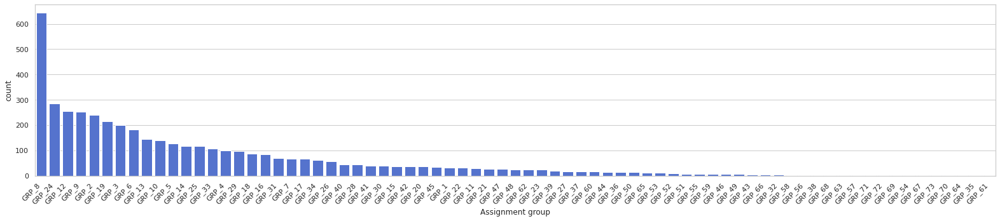

In [179]:
descending_order = df6['Assignment group'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(22,5))
ax=sns.countplot(x='Assignment group', data=df6, color='royalblue',order=descending_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [180]:

maxOthers = df6['Assignment group'].value_counts().max()
maxOthers

645

In [194]:
df6 =df4[df4['Assignment group'] != 'GRP_0']

In [195]:
df6.head()

,Assignment group,New Description,Lemmatized clean,Assignment group ID
6,GRP_1,event critical hostname pany the value of moun...,"[event, critical, hostname, pany, value, mount...",1
17,GRP_3,when undocking pc screen will not e back when ...,"[undocking, pc, screen, e, back, undocking, pc...",23
32,GRP_4,duplication of network address received from k...,"[duplication, network, address, receive, kxsce...",34
43,GRP_5,please reroute jobs on printer to printer issu...,"[please, reroute, job, printer, printer, issue...",45
47,GRP_6,job job failed in job scheduler at received fr...,"[job, job, fail, job, scheduler, receive, moni...",56


In [196]:
df6_copy= df6.drop(['Lemmatized clean','Assignment group ID'],axis=1)

In [197]:
df6_copy.head()

,Assignment group,New Description
6,GRP_1,event critical hostname pany the value of moun...
17,GRP_3,when undocking pc screen will not e back when ...
32,GRP_4,duplication of network address received from k...
43,GRP_5,please reroute jobs on printer to printer issu...
47,GRP_6,job job failed in job scheduler at received fr...


In [258]:

df6_copy = df6_copy[["New Description", "Assignment group"]]
df6_copy = df6_copy.reset_index(drop=True)
df6_copy.head(10)

,New Description,Assignment group
0,event critical hostname pany the value of moun...,GRP_1
1,when undocking pc screen will not e back when ...,GRP_3
2,duplication of network address received from k...,GRP_4
3,please reroute jobs on printer to printer issu...,GRP_5
4,job job failed in job scheduler at received fr...,GRP_6
5,status does not change on telephony software w...,GRP_7
6,job mm zscr dly merktc failed in job scheduler...,GRP_8
7,need dn for material plant plant pcs thanks ne...,GRP_6
8,job mm zscr dly merktc failed in job scheduler...,GRP_8
9,job job failed in job scheduler at received fr...,GRP_8


In [259]:
upsampler = RandomOverSampler(sampling_strategy='auto',random_state=0)
X,y = upsampler.fit_sample(df6_copy.drop(['Assignment group'],axis=1),df6_copy['Assignment group'])

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [260]:
temp_df_y["Assignment group"] = pd.DataFrame(y)
temp_df_X["New Description"] = pd.DataFrame(X)

In [261]:
upscaling_df = pd.concat([temp_df_X, temp_df_y], axis = 1)

In [262]:
upscaling_df['Assignment group'].value_counts()

GRP_69    645
GRP_1     645
GRP_5     645
GRP_13    645
GRP_55    645
GRP_28    645
GRP_26    645
GRP_38    645
GRP_68    645
GRP_41    645
GRP_71    645
GRP_65    645
GRP_61    645
GRP_47    645
GRP_6     645
GRP_51    645
GRP_40    645
GRP_35    645
GRP_44    645
GRP_33    645
GRP_22    645
GRP_9     645
GRP_31    645
GRP_58    645
GRP_63    645
GRP_27    645
GRP_39    645
GRP_24    645
GRP_52    645
GRP_45    645
GRP_66    645
GRP_12    645
GRP_70    645
GRP_46    645
GRP_15    645
GRP_54    645
GRP_48    645
GRP_25    645
GRP_29    645
GRP_20    645
GRP_37    645
GRP_72    645
GRP_7     645
GRP_34    645
GRP_73    645
GRP_42    645
GRP_3     645
GRP_59    645
GRP_11    645
GRP_64    645
GRP_18    645
GRP_8     645
GRP_19    645
GRP_2     645
GRP_14    645
GRP_36    645
GRP_16    645
GRP_32    645
GRP_23    645
GRP_53    645
GRP_56    645
GRP_43    645
GRP_50    645
GRP_10    645
GRP_30    645
GRP_49    645
GRP_4     645
GRP_57    645
GRP_21    645
GRP_17    645
GRP_62    645
GRP_67

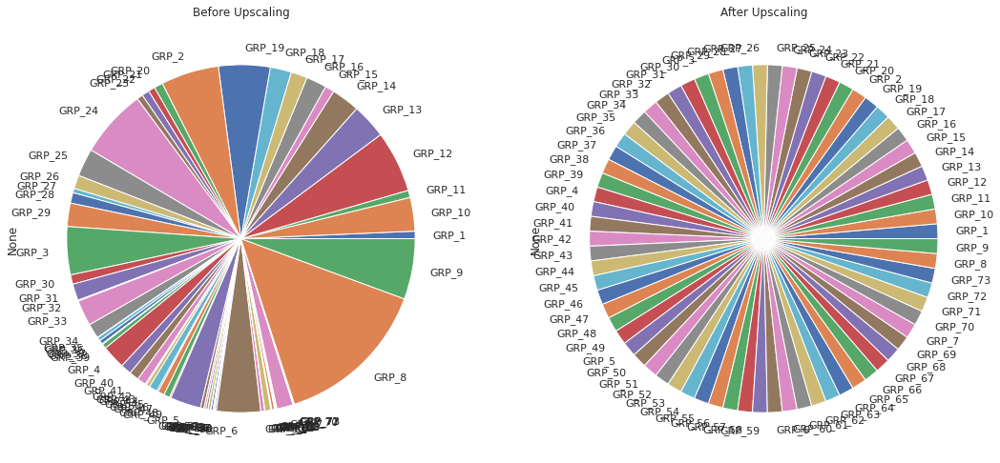

In [263]:
plt.figure(figsize=(18,18))

plt.subplot(1, 2, 1)
pre_assignment_group_count_df = df6_copy.groupby('Assignment group').size()
pre_assignment_group_count_df.plot.pie()
plt.title('Before Upscaling')

plt.subplot(1, 2, 2)
assignment_group_count_df = upscaling_df.groupby('Assignment group').size()
assignment_group_count_df.plot.pie()

plt.title('After Upscaling')
plt.show()

In [264]:
df5.head()

,Assignment group,New Description
0,GRP_0_3,login issue verified user details employee man...
1,GRP_0_1,outlook received from hmjdrvpb komuaywn team m...
2,GRP_0_6,cannot log in to vpn received from eylqgodm yb...
3,GRP_0_0,unable to access hr tool page unable to access...
4,GRP_0_4,skype error skype error


In [265]:
upscaling_df.head()

,0,New Decription,New Description,0,Assignment group
0,event critical hostname pany the value of moun...,event critical hostname pany the value of moun...,event critical hostname pany the value of moun...,GRP_1,GRP_1
1,when undocking pc screen will not e back when ...,when undocking pc screen will not e back when ...,when undocking pc screen will not e back when ...,GRP_3,GRP_3
2,duplication of network address received from k...,duplication of network address received from k...,duplication of network address received from k...,GRP_4,GRP_4
3,please reroute jobs on printer to printer issu...,please reroute jobs on printer to printer issu...,please reroute jobs on printer to printer issu...,GRP_5,GRP_5
4,job job failed in job scheduler at received fr...,job job failed in job scheduler at received fr...,job job failed in job scheduler at received fr...,GRP_6,GRP_6


In [266]:
df7= upscaling_df.drop( labels=0,axis =1)

In [267]:
df7.head()

,New Decription,New Description,Assignment group
0,event critical hostname pany the value of moun...,event critical hostname pany the value of moun...,GRP_1
1,when undocking pc screen will not e back when ...,when undocking pc screen will not e back when ...,GRP_3
2,duplication of network address received from k...,duplication of network address received from k...,GRP_4
3,please reroute jobs on printer to printer issu...,please reroute jobs on printer to printer issu...,GRP_5
4,job job failed in job scheduler at received fr...,job job failed in job scheduler at received fr...,GRP_6


In [268]:
df7.drop('New Decription',axis=1,inplace=True)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4169: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [269]:
columns_titles = ["Assignment group","New Description"]
df7=df7.reindex(columns=columns_titles)

In [270]:
df7.head()

,Assignment group,New Description
0,GRP_1,event critical hostname pany the value of moun...
1,GRP_3,when undocking pc screen will not e back when ...
2,GRP_4,duplication of network address received from k...
3,GRP_5,please reroute jobs on printer to printer issu...
4,GRP_6,job job failed in job scheduler at received fr...


In [271]:
finalized_df = pd.concat([df7, df5], axis = 0)

In [272]:
finalized_df.head()

,Assignment group,New Description
0,GRP_1,event critical hostname pany the value of moun...
1,GRP_3,when undocking pc screen will not e back when ...
2,GRP_4,duplication of network address received from k...
3,GRP_5,please reroute jobs on printer to printer issu...
4,GRP_6,job job failed in job scheduler at received fr...


In [257]:
finalized_df.to_csv('/content/drive/My Drive/Assignment/finalized_df_csv_file.csv')

In [273]:
finalized_df.shape

(50514, 2)

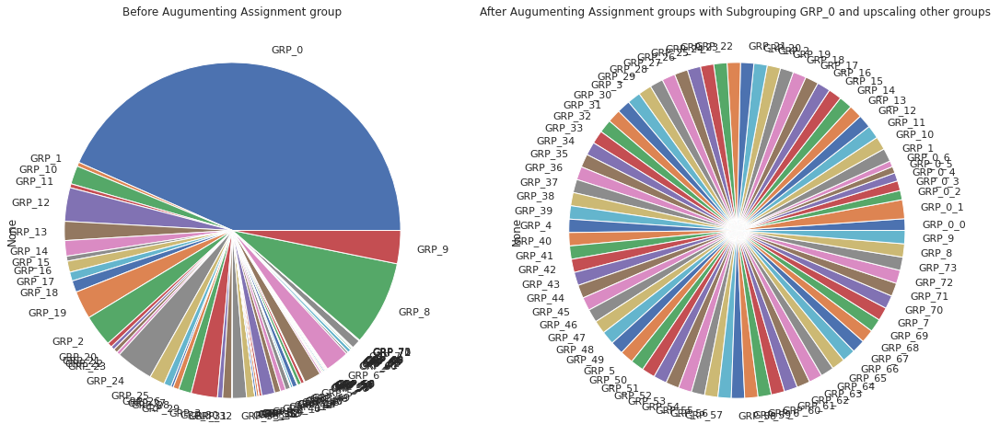

In [274]:
plt.figure(figsize=(18,18))

plt.subplot(1, 2, 1)
pre_GRP_treatment_df = df4.groupby('Assignment group').size()
pre_GRP_treatment_df.plot.pie()
plt.title('Before Augumenting Assignment group')

plt.subplot(1, 2, 2)
post_GRP_treatment_df = finalized_df.groupby('Assignment group').size()
post_GRP_treatment_df.plot.pie()

plt.title('After Augumenting Assignment groups with Subgrouping GRP_0 and upscaling other groups ')
plt.show()

In [275]:
finalized_df['Assignment group'].unique()

array(['GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7', 'GRP_8',
       'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
       'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
       'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
       'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
       'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
       'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
       'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
       'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73',
       'GRP_0_3', 'GRP_0_1', 'GRP_0_6', 'GRP_0_0', 'GRP_0_4', 'GRP_0_2',
       'GRP_0_5'], dtype=object)

In [276]:
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'species'. 
finalized_df['Assignment group LabelEncode']= label_encoder.fit_transform(finalized_df['Assignment group']) 

finalized_df['Assignment group LabelEncode'].unique()

array([ 7, 29, 40, 51, 62, 73, 78, 79,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 33, 34, 35,
       36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54,
       55, 56, 57, 58, 59, 60, 61, 63, 64, 32, 65, 66, 67, 68, 69, 70, 71,
       72, 74, 75, 76, 77,  3,  1,  6,  0,  4,  2,  5])

In [277]:
label_encoded_dict = dict(zip(final_df['Assignment group'].unique(), final_df['Assignment group LabelEncode'].unique()))

In [233]:
len(label_encoded_dict)

80

In [280]:
maxlen = 300
numWords = 9000
tokenizer,X = wordTokenizer(finalized_df['New Description'])
y = finalized_df['Assignment group LabelEncode']
X = pad_sequences(X, maxlen = maxlen)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

In [282]:
X_train.shape,X_test.shape

((35359, 300), (15155, 300))

In [281]:

y_train.shape,y_test.shape

((35359,), (15155,))

In [283]:
vocab_size = len(tokenizer.word_index) + 1

In [284]:
num_class = len(np.unique(finalized_df['Assignment group LabelEncode'].values))

In [285]:
inputs = Input(shape=(maxlen, ))
embedding_layer = Embedding(vocab_size,
                            128,
                            input_length=maxlen)(inputs)

x = LSTM(64)(embedding_layer)
x = Dense(32, activation='relu')(x)
predictions = Dense(num_class, activation='softmax')(x)
model = Model(inputs=[inputs], outputs=predictions)
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])

model.summary()
filepath="weights.hdf5"
checkpointer = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
history = model.fit([X_train], batch_size=64, y=to_categorical(y_train), verbose=1, validation_split=0.3, 
          shuffle=True, epochs=10, callbacks=[checkpointer])

Model: "functional_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 300)]             0         
_________________________________________________________________
embedding_4 (Embedding)      (None, 300, 128)          1969792   
_________________________________________________________________
lstm_4 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dense_8 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_9 (Dense)              (None, 80)                2640      
Total params: 2,023,920
Trainable params: 2,023,920
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
387/387 [==============================] - ETA: 0s - loss: 2.5470 - acc: 0.4147
Epoch 00001: val_ac

In [290]:
predicted = model.predict(X_test)
predicted = np.argmax(predicted, axis=1)
accuracy=accuracy_score(y_test, predicted)
accuracy

0.8918508742989113

In [298]:
maxlen = 300
numWords = 9000
tokenizer,X = wordTokenizer(finalized_df['New Description'])
y = finalized_df['Assignment group LabelEncode']
X = pad_sequences(X, maxlen = maxlen)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

In [300]:
y_train.shape,y_test.shape

((35359,), (15155,))

In [299]:
X_train.shape,X_test.shape

((35359, 300), (15155, 300))

In [301]:
vocab_size = len(tokenizer.word_index) + 1
num_class = len(np.unique(finalized_df['Assignment group LabelEncode'].values))

In [302]:
max_features = vocab_size  
maxlen = 300
seq_output_size = 128
filters = 64
kernel_size = 5
pool_size = 4
activation_func = 'sigmoid'

In [303]:

from keras import layers

In [304]:
# Bi directional LSTM
# Input for variable-length sequences of integers
inputs = keras.Input(shape=(None,), dtype="int32")
# Embed each integer in a 128-dimensional vector
x = layers.Embedding(max_features, 128)(inputs)
x = layers.Dropout(0.2)(x)
# Add 2 bidirectional LSTMs
x = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)
x = layers.Bidirectional(layers.LSTM(64))(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(32, activation='relu')(x)
outputs = layers.Dense(num_class, activation='softmax')(x)
# Add a classifier
bilstm_model = keras.Model(inputs, outputs)
bilstm_model.summary()

Model: "functional_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, None)]            0         
_________________________________________________________________
embedding_6 (Embedding)      (None, None, 128)         1969792   
_________________________________________________________________
dropout_2 (Dropout)          (None, None, 128)         0         
_________________________________________________________________
bidirectional_2 (Bidirection (None, None, 128)         98816     
_________________________________________________________________
bidirectional_3 (Bidirection (None, 128)               98816     
_________________________________________________________________
dropout_3 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_12 (Dense)             (None, 32)              

In [305]:
bilstm_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['acc'])
bilstm_model.fit(X_train, y_train, batch_size=20, epochs=7, validation_data=(X_test, y_test))

Epoch 1/7
1768/1768 [==============================] - 1150s 650ms/step - loss: 2.2541 - acc: 0.4156 - val_loss: 1.0212 - val_acc: 0.7182
Epoch 2/7
1768/1768 [==============================] - 1145s 648ms/step - loss: 0.8095 - acc: 0.7744 - val_loss: 0.6254 - val_acc: 0.8216
Epoch 3/7
1768/1768 [==============================] - 1146s 648ms/step - loss: 0.5487 - acc: 0.8424 - val_loss: 0.5089 - val_acc: 0.8542
Epoch 4/7
1768/1768 [==============================] - 1144s 647ms/step - loss: 0.4495 - acc: 0.8682 - val_loss: 0.4578 - val_acc: 0.8698
Epoch 5/7
1768/1768 [==============================] - 1146s 648ms/step - loss: 0.3816 - acc: 0.8832 - val_loss: 0.4079 - val_acc: 0.8815
Epoch 6/7
1768/1768 [==============================] - 1147s 649ms/step - loss: 0.3364 - acc: 0.8968 - val_loss: 0.4141 - val_acc: 0.8886
Epoch 7/7
1768/1768 [==============================] - 1142s 646ms/step - loss: 0.3060 - acc: 0.9035 - val_loss: 0.3815 - val_acc: 0.8957


In [307]:
predicted = bilstm_model.predict(X_test)
predicted = np.argmax(predicted, axis=1)
accuracy=accuracy_score(y_test, predicted)
accuracy

0.8957439788848565